<a href="https://colab.research.google.com/github/GerardoMunoz/PresentacionesAlgebraLineal/blob/main/proy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
import sympy as sp
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation,rc
from mpl_toolkits.mplot3d import Axes3D


def ejes3d(x0,y0,z0,x1,y1,z1,ejes='x'):
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.set_xlim([x0,x1])
    ax.set_ylim([y0,y1])
    ax.set_zlim([z0,z1])
    ax.set_xlabel('$'+ejes+'_0$')
    ax.set_ylabel('$'+ejes+'_1$')
    ax.set_zlabel('$'+ejes+'_2$')
    punto3d(ax,(0,0,0),nombre=r'$\vec{0}$')

    return fig,ax


def dibujo():                           # En esta rutina se colocan los puntos y líneas para la animación
    return fig,    

def animacion_paso_3d(ax,fig,angulo):
    ax.view_init(elev=10., azim=angulo)
    return fig, 

def animacion3d(fig,ax,dibujo=dibujo, fps=10, segundos=1):
    plt.close(fig)
    rc('animation', html='jshtml')
    frames=fps*segundos
    return animation.FuncAnimation(fig, lambda i : animacion_paso_3d(ax,fig,i/frames*90), init_func=dibujo,
                               frames=frames, interval=int(1000/fps), blit=True)

def linea3d(ax,u,v=(0,0,0),color='k',**kwargs):
    ax.plot((u[0],v[0]),(u[1],v[1]),(u[2],v[2]),color)

def plano3d(ax,u,v,color='k',**kwargs):
    x_min,x_max=ax.get_xlim()
    y_min,y_max=ax.get_ylim()
    det=u[0]*v[1]-u[1]*v[0]
    kx=(v[1]*u[2]-u[1]*v[2])/det
    ky=-(v[0]*u[2]-u[0]*v[2])/det

    xx=[[x_min,x_max],[x_min,x_max]]
    yy=[[y_min,y_min],[y_max,y_max]]
    zz=np.array([[kx*x_min+ky*y_min,kx*x_max+ky*y_min],[kx*x_min+ky*y_max,kx*x_max+ky*y_max]]).astype(np.float64)

    ax.plot_surface(xx, yy, zz, alpha=0.2)
    
def punto3d(ax,v,nombre='',fontsize=15, c="goldenrod",**kwargs):
    ax.scatter(v[0],v[1],float(v[2]), marker='o', s=20, c="goldenrod", alpha=0.6)
    if nombre!='':
        ax.text(v[0],v[1],v[2],nombre,fontsize=fontsize)        

def p(v):
    return '('+', '.join([str(ai) for ai in v])+')\u1D57'#'\u209c'

# Ejemplos de Proyección



In [25]:
import sympy as sp
u=sp.Matrix([[1],
             [1],
             [1]])
u


Matrix([
[1],
[1],
[1]])

In [26]:
v=sp.Matrix([[2],
             [2],
             [0]])
 
v

Matrix([
[2],
[2],
[0]])

In [27]:
u_pr = u.dot(v) / v.dot(v) * v
u_pr

Matrix([
[1],
[1],
[0]])

In [28]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
linea3d(ax,u)
linea3d(ax,u_pr)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

In [29]:
u=sp.Matrix([1,2,3])
v=sp.Matrix([3,1,2])
u_pr = u.dot(v) / v.dot(v) * v

In [30]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
linea3d(ax,u)
linea3d(ax,u_pr)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

In [31]:
u=sp.Matrix([3,1,2])
v=sp.Matrix([1,2,3])
u_pr = u.dot(v) / v.dot(v) * v

In [32]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v,nombre=r'$\vec{v}$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,u_pr,nombre=r'$\vec{u}_pr$')  # Coloca el punto
linea3d(ax,v)
linea3d(ax,u)
linea3d(ax,u_pr)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

# Ejemplo de mínimos cuadrados 

Sabemos que el siguiente sistema $[A:\vec{u}]$ es inconsistente

$$\left[\begin{matrix}3 & 1 & : & 1\\1 & 1 & : & 3\\1 & 3 & : & 1\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\3 & 1 & : & 1\\1 & 3 & : & 1\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\0 & -2 & : & -8\\0 & 2 & : & -2\end{matrix}\right]
\sim \left[\begin{matrix}1 & 1 & : & 3\\0 & -2 & : & -8\\0 & 0 & : & -10\end{matrix}\right]
$$

Esto implica que el vector $\vec{u}$ no está en el espacio generado por las columnas de $A=\begin{bmatrix}\vec{v}_1 &
\vec{v}_2 \end{bmatrix}$.

In [33]:
import sympy as sp
v1=sp.Matrix([[3],
             [1],
             [1]])
 
v2=sp.Matrix([[1],
              [1],
              [3]])

u=sp.Matrix([[1],
             [3],
             [1]])

A=v1.row_join(v2)
A

Matrix([
[3, 1],
[1, 1],
[1, 3]])

In [34]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v1,nombre=r'$\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,v2,nombre=r'$\vec{v}_2$')  # Coloca el punto
linea3d(ax,v1)
linea3d(ax,u)
linea3d(ax,v2)
plano3d(ax,v1,v2)

animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

Encontramos el vector $\vec{w}$ usando **mínimos cuadrados**.
$$\vec{w} = (A^T A )^{-1}A^T \vec{u}$$

In [35]:
w = (A.T * A ).inv()* A.T * u

(k1,k2) = w

(k1,k2)

(7/18, 7/18)

In [36]:
u_proy=k1*v1+k2*v2
u_proy

Matrix([
[14/9],
[ 7/9],
[14/9]])

In [37]:
fps=20
segundos=2

fig,ax=ejes3d(-1,-1,-1,3,3,3) 

punto3d(ax,v1,nombre=r'$\vec{v}_1$')  # Coloca el punto
punto3d(ax,u,nombre=r'$\vec{u}$')  # Coloca el punto
punto3d(ax,v2,nombre=r'$\vec{v}_2$')  # Coloca el punto
punto3d(ax,k1*v1,nombre=r'$k_{1}\vec{v}_1$')  # Coloca el punto
punto3d(ax,k2*v2,nombre=r'$k_{2}\vec{v}_2$')  # Coloca el punto
punto3d(ax,u_proy,nombre=r'$\vec{u}_{proy}$')  # Coloca el punto
linea3d(ax,v1)
linea3d(ax,u)
linea3d(ax,k1*v1,u_proy)
linea3d(ax,k2*v2,u_proy)
linea3d(ax,v2)
plano3d(ax,v1,v2)


animacion3d(fig,ax, fps=fps, segundos=segundos)  # Genera la animación para rotar  

$U_{proy}=k_1\vec{v}_1+k_2\vec{v}_2=\begin{bmatrix}\vec{v}_1 & \vec{v}_2 \end{bmatrix}\begin{pmatrix}k_1 \\ k_2 \end{pmatrix}=A\vec{w}$

# Regresión Lineal

Vamos a usar mínimos cuadrados para encontrar una recta $mx+b=y$ en $\mathbb{R}^2$ que pase lo más cerca de unos puntos. Por ejemplo, los siguientes 5 puntos. 

In [38]:
P=sp.Matrix([[1,  1.5, 2.5, 3.5,  4 ],
             [2,  4,   5,   6,    8 ]
             ])
P

Matrix([
[1, 1.5, 2.5, 3.5, 4],
[2,   4,   5,   6, 8]])

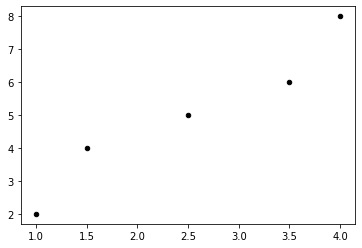

In [39]:
fig,ax=plt.subplots()
ax.scatter(*np.array(P) ,s=20,color='k')
plt.show()

Al remplazar cada punto en la ecuación $mx+b=y$ obtenemos 5 ecuaciones, cuya matriz extendida es: 

In [40]:
M=((P.T)[:,0]).row_join(sp.ones(5,1)).row_join((P.T)[:,1])
M

Matrix([
[  1, 1, 2],
[1.5, 1, 4],
[2.5, 1, 5],
[3.5, 1, 6],
[  4, 1, 8]])

In [41]:
A=M[:,:-1]
A

Matrix([
[  1, 1],
[1.5, 1],
[2.5, 1],
[3.5, 1],
[  4, 1]])

In [42]:
u=M[:,-1]
u

Matrix([
[2],
[4],
[5],
[6],
[8]])

In [43]:
w=(A.T*A).inv()*A.T*u
m,b=w
m,b

(1.69230769230769, 0.769230769230770)

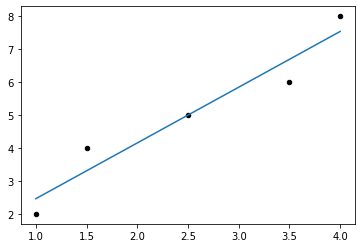

In [44]:
fig,ax=plt.subplots()
ax.scatter(*np.array(P) ,s=20,color='k')
X=[1,4]
Y=[m*x+b for x in X]
ax.plot(X,Y)    
plt.show()